## Load Packages

In [48]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import math
import bayesflow as bf
import os
from numba import njit
from sklearn.preprocessing import StandardScaler
import numba as nb
import copy
import random
from tensorflow.keras import backend as K
import gc
from pathlib import Path
from tensorflow.keras.utils import to_categorical
from tensorflow_probability import distributions as tfd
import tensorflow as tf
import ipynbname
RNG = np.random.default_rng(2023)
from diffusion_functions import diffusion_trial, diffusion_prior, generate_condition_matrix, diffusion_configurator
# Suppress scientific notation for floats
np.set_printoptions(suppress=True)



## Get file path

In [49]:
notebook_path = Path(ipynbname.path()).resolve().parent
root_dir = notebook_path.parent
#print(root_dir)

## Define checkpoint

In [50]:
checkpoint_path =  root_dir/ "networks/standard"

checkpoint_path_uniform = root_dir/ "networks/uniform"
checkpoint_path_t_df1 = root_dir/ "networks/t_df1"
checkpoint_path_t_df3 = root_dir/ "networks/t_df3"
checkpoint_path_t_df5 = root_dir/ "networks/t_df5"

checkpoint_path_001 = root_dir/ "networks/contamination probability/pi=0.01"
checkpoint_path_005 = root_dir/ "networks/contamination probability/pi=0.05"
checkpoint_path_010 = root_dir/ "networks/contamination probability/pi=0.10"
checkpoint_path_020 = root_dir/ "networks/contamination probability/pi=0.20"

## Set up prior and condition matrix

In [51]:
PARAM_NAMES = [
    r'$v_1$',
    r'$v_2$',
    r'$a$',
    r'$z$',
    r'$T_{er}$'
]

prior = bf.simulation.Prior(prior_fun=diffusion_prior, param_names=PARAM_NAMES)

MIN_OBS = 100
MAX_OBS = 1000
NUM_CONDITIONS=2

def random_num_obs(min_obs=MIN_OBS, max_obs=MAX_OBS):
    """Draws a random number of observations for all simulations in a batch."""

    return 100

context_gen = bf.simulation.ContextGenerator(
    non_batchable_context_fun=random_num_obs,
    batchable_context_fun=generate_condition_matrix,
    use_non_batchable_for_batchable=True
)

## Set up DDM model and estimator

### Standard estimator

In [52]:
@nb.jit(nopython=True)
def diffusion_experiment(theta, design_matrix, num_obs, rng=None, *args):
    
    out = np.zeros((num_obs, 2))
    for n in range(num_obs):
        index = design_matrix[n]
        rt,resp = diffusion_trial(theta[index], theta[-3], theta[-2], theta[-1])
        out[n, :] = np.array([rt,resp])
        
    out[:,0] = np.log(out[:,0])
    
    return out

simulator = bf.simulation.Simulator(simulator_fun=diffusion_experiment, context_generator=context_gen)

model = bf.simulation.GenerativeModel(prior=prior, simulator=simulator)

summary_net = bf.networks.SetTransformer(input_dim=4, summary_dim=12)

inference_net = bf.networks.InvertibleNetwork(
    num_params=len(prior.param_names),
    coupling_design="interleaved",
    name="ddm_inference",
)

amortizer = bf.amortizers.AmortizedPosterior(inference_net, summary_net)

trainer = bf.trainers.Trainer(
    generative_model=model, amortizer=amortizer, configurator=diffusion_configurator
    ,checkpoint_path = checkpoint_path
)
amortizer.summary()

INFO:root:Performing 2 pilot runs with the anonymous model...
INFO:root:Shape of parameter batch after 2 pilot simulations: (batch_size = 2, 5)
INFO:root:Shape of simulation batch after 2 pilot simulations: (batch_size = 2, 100, 2)
INFO:root:No optional prior non-batchable context provided.
INFO:root:No optional prior batchable context provided.
INFO:root:Could not determine shape of simulation non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Could not determine shape of simulation batchable context. Type appears to be non-array: <class 'list'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Loaded loss history from C:\Users\u0145642\OneDrive - KU Leuven\Desktop\Robust amortized Bayesian inference\3 ddm\networks\standard\history_100.pkl.
INFO:root:Networks loaded from C:\Users\u0145642\OneDrive - KU Leuven\Desk

Model: "amortized_posterior_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 ddm_inference (InvertibleN  multiple                  434037    
 etwork)                                                         
                                                                 
 set_transformer_10 (SetTra  multiple                  46544     
 nsformer)                                                       
                                                                 
Total params: 480581 (1.83 MB)
Trainable params: 480521 (1.83 MB)
Non-trainable params: 60 (240.00 Byte)
_________________________________________________________________


### Robust estimator (t, df=1)

In [53]:
@nb.jit(nopython=True)

def diffusion_experiment_contaminated_t_df1(theta, design_matrix, num_obs, rng=None, *args):
    out = np.zeros((num_obs, 2))
    for n in range(num_obs):
        index = design_matrix[n]
        rt,resp = diffusion_trial(theta[index], theta[-3], theta[-2], theta[-1])
        out[n, :] = np.array([rt,resp])
    
    #log transformation
    out[:,0] = np.log(out[:,0])
    
    CC=np.random.standard_t(df=1,size=num_obs)
    X=np.random.binomial(n=1,p=.1,size=num_obs)
    out[:,0] = (1-X)*out[:,0] + (X)*np.log(np.abs(CC))
    out[:,1] = (1-X)*out[:,1] + (X)*np.random.binomial(n=1,p=0.5,size=num_obs)
    
    return out

simulator_t_df1 = bf.simulation.Simulator(simulator_fun=diffusion_experiment_contaminated_t_df1, context_generator=context_gen)

model_t_df1 = bf.simulation.GenerativeModel(prior=prior, simulator=simulator_t_df1)

#SetTransformer() is a permutation invariant network
#input_dim = how many dimensions the configured data would have
#here we have a RT, dummy coded variable for the two choices (one or two?), the context dummy
summary_net_t_df1 = bf.networks.SetTransformer(input_dim=4, summary_dim=12)

#we are turning off the kernel and dropout regularization for the networks 
#since we don’t need these for online training
inference_net_t_df1 = bf.networks.InvertibleNetwork(
    num_params=len(prior.param_names),
    coupling_design="interleaved",
    name="ddm_inference",
)

amortizer_t_df1 = bf.amortizers.AmortizedPosterior(inference_net_t_df1, summary_net_t_df1)


trainer_t_df1 = bf.trainers.Trainer(
    generative_model=model_t_df1, amortizer=amortizer_t_df1, configurator=diffusion_configurator,
    checkpoint_path = checkpoint_path_t_df1
)
amortizer_t_df1.summary()

#history = trainer_c_t_df1.train_online(epochs=100, iterations_per_epoch=1000, batch_size=32)

INFO:root:Performing 2 pilot runs with the anonymous model...
INFO:root:Shape of parameter batch after 2 pilot simulations: (batch_size = 2, 5)
INFO:root:Shape of simulation batch after 2 pilot simulations: (batch_size = 2, 100, 2)
INFO:root:No optional prior non-batchable context provided.
INFO:root:No optional prior batchable context provided.
INFO:root:Could not determine shape of simulation non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Could not determine shape of simulation batchable context. Type appears to be non-array: <class 'list'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Loaded loss history from C:\Users\u0145642\OneDrive - KU Leuven\Desktop\Robust amortized Bayesian inference\3 ddm\networks\t_df1\history_100.pkl.
INFO:root:Networks loaded from C:\Users\u0145642\OneDrive - KU Leuven\Desktop

Model: "amortized_posterior_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 ddm_inference (InvertibleN  multiple                  434037    
 etwork)                                                         
                                                                 
 set_transformer_11 (SetTra  multiple                  46544     
 nsformer)                                                       
                                                                 
Total params: 480581 (1.83 MB)
Trainable params: 480521 (1.83 MB)
Non-trainable params: 60 (240.00 Byte)
_________________________________________________________________


### Robust estimator (t, df=3)

In [54]:
@nb.jit(nopython=True)

def diffusion_experiment_contaminated_t_df3(theta, design_matrix, num_obs, rng=None, *args):
    out = np.zeros((num_obs, 2))
    for n in range(num_obs):
        index = design_matrix[n]
        rt,resp = diffusion_trial(theta[index], theta[-3], theta[-2], theta[-1])
        out[n, :] = np.array([rt,resp])
    
    #log transformation
    out[:,0] = np.log(out[:,0])
    
    CC=np.random.standard_t(df=3,size=num_obs)
    X=np.random.binomial(n=1,p=.1,size=num_obs)
    out[:,0] = (1-X)*out[:,0] + (X)*np.log(np.abs(CC))
    out[:,1] = (1-X)*out[:,1] + (X)*np.random.binomial(n=1,p=0.5,size=num_obs)
    
    return out

simulator_t_df3 = bf.simulation.Simulator(simulator_fun=diffusion_experiment_contaminated_t_df3, context_generator=context_gen)

model_t_df3 = bf.simulation.GenerativeModel(prior=prior, simulator=simulator_t_df3)

#SetTransformer() is a permutation invariant network
#input_dim = how many dimensions the configured data would have
#here we have a RT, dummy coded variable for the two choices (one or two?), the context dummy
summary_net_t_df3 = bf.networks.SetTransformer(input_dim=4, summary_dim=12)

#we are turning off the kernel and dropout regularization for the networks 
#since we don’t need these for online training
inference_net_t_df3 = bf.networks.InvertibleNetwork(
    num_params=len(prior.param_names),
    coupling_design="interleaved",
    name="ddm_inference",
)

amortizer_t_df3 = bf.amortizers.AmortizedPosterior(inference_net_t_df3, summary_net_t_df3)


trainer_t_df3 = bf.trainers.Trainer(
    generative_model=model_t_df3, amortizer=amortizer_t_df3, configurator=diffusion_configurator,
    checkpoint_path = checkpoint_path_t_df3
)
amortizer_t_df3.summary()

#history = trainer_c_t_df3.train_online(epochs=100, iterations_per_epoch=1000, batch_size=32)

INFO:root:Performing 2 pilot runs with the anonymous model...
INFO:root:Shape of parameter batch after 2 pilot simulations: (batch_size = 2, 5)
INFO:root:Shape of simulation batch after 2 pilot simulations: (batch_size = 2, 100, 2)
INFO:root:No optional prior non-batchable context provided.
INFO:root:No optional prior batchable context provided.
INFO:root:Could not determine shape of simulation non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Could not determine shape of simulation batchable context. Type appears to be non-array: <class 'list'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Loaded loss history from C:\Users\u0145642\OneDrive - KU Leuven\Desktop\Robust amortized Bayesian inference\3 ddm\networks\t_df3\history_100.pkl.
INFO:root:Networks loaded from C:\Users\u0145642\OneDrive - KU Leuven\Desktop

Model: "amortized_posterior_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 ddm_inference (InvertibleN  multiple                  434037    
 etwork)                                                         
                                                                 
 set_transformer_12 (SetTra  multiple                  46544     
 nsformer)                                                       
                                                                 
Total params: 480581 (1.83 MB)
Trainable params: 480521 (1.83 MB)
Non-trainable params: 60 (240.00 Byte)
_________________________________________________________________


### Robust estimator (t, df=5)

In [55]:
@nb.jit(nopython=True)

def diffusion_experiment_contaminated_t_df5(theta, design_matrix, num_obs, rng=None, *args):
    out = np.zeros((num_obs, 2))
    for n in range(num_obs):
        index = design_matrix[n]
        rt,resp = diffusion_trial(theta[index], theta[-3], theta[-2], theta[-1])
        out[n, :] = np.array([rt,resp])
    
    #log transformation
    out[:,0] = np.log(out[:,0])
    
    CC=np.random.standard_t(df=5,size=num_obs)
    X=np.random.binomial(n=1,p=.1,size=num_obs)
    out[:,0] = (1-X)*out[:,0] + (X)*np.log(np.abs(CC))
    out[:,1] = (1-X)*out[:,1] + (X)*np.random.binomial(n=1,p=0.5,size=num_obs)
    
    return out

simulator_t_df5 = bf.simulation.Simulator(simulator_fun=diffusion_experiment_contaminated_t_df5, context_generator=context_gen)

model_t_df5 = bf.simulation.GenerativeModel(prior=prior, simulator=simulator_t_df5)

#SetTransformer() is a permutation invariant network
#input_dim = how many dimensions the configured data would have
#here we have a RT, dummy coded variable for the two choices (one or two?), the context dummy
summary_net_t_df5 = bf.networks.SetTransformer(input_dim=4, summary_dim=12)

#we are turning off the kernel and dropout regularization for the networks 
#since we don’t need these for online training
inference_net_t_df5 = bf.networks.InvertibleNetwork(
    num_params=len(prior.param_names),
    coupling_design="interleaved",
    name="ddm_inference",
)

amortizer_t_df5 = bf.amortizers.AmortizedPosterior(inference_net_t_df5, summary_net_t_df5)


trainer_t_df5 = bf.trainers.Trainer(
    generative_model=model_t_df5, amortizer=amortizer_t_df5, configurator=diffusion_configurator,
    checkpoint_path = checkpoint_path_t_df5
)
amortizer_t_df5.summary()

#history = trainer_c_t_df5.train_online(epochs=100, iterations_per_epoch=1000, batch_size=32)

INFO:root:Performing 2 pilot runs with the anonymous model...
INFO:root:Shape of parameter batch after 2 pilot simulations: (batch_size = 2, 5)
INFO:root:Shape of simulation batch after 2 pilot simulations: (batch_size = 2, 100, 2)
INFO:root:No optional prior non-batchable context provided.
INFO:root:No optional prior batchable context provided.
INFO:root:Could not determine shape of simulation non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Could not determine shape of simulation batchable context. Type appears to be non-array: <class 'list'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Loaded loss history from C:\Users\u0145642\OneDrive - KU Leuven\Desktop\Robust amortized Bayesian inference\3 ddm\networks\t_df5\history_100.pkl.
INFO:root:Networks loaded from C:\Users\u0145642\OneDrive - KU Leuven\Desktop

Model: "amortized_posterior_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 ddm_inference (InvertibleN  multiple                  434037    
 etwork)                                                         
                                                                 
 set_transformer_13 (SetTra  multiple                  46544     
 nsformer)                                                       
                                                                 
Total params: 480581 (1.83 MB)
Trainable params: 480521 (1.83 MB)
Non-trainable params: 60 (240.00 Byte)
_________________________________________________________________


### Robust estimator (U(0,20))

In [56]:
@nb.jit(nopython=True,parallel=True)
def diffusion_experiment_contaminated_uniform(theta, design_matrix, num_obs, rng=None, *args):
    
    out = np.zeros((num_obs, 2))
    for n in range(num_obs):
        index = design_matrix[n]
        rt,resp = diffusion_trial(theta[index], theta[-3], theta[-2], theta[-1])
        out[n, :] = np.array([rt,resp])
    
    out[:,0] = np.log(out[:,0])
    
    CC=np.random.uniform(0,20,size=num_obs)
    X=np.random.binomial(n=1,p=.1,size=num_obs)
    out[:,0] = (1-X)*out[:,0] + (X)*np.log(CC)
    out[:,1] = (1-X)*out[:,1] + (X)*np.random.binomial(n=1,p=0.5,size=num_obs)
    
    return out

simulator_uniform = bf.simulation.Simulator(simulator_fun=diffusion_experiment_contaminated_uniform, context_generator=context_gen)

model_uniform = bf.simulation.GenerativeModel(prior=prior, simulator=simulator_uniform)

summary_net_uniform = bf.networks.SetTransformer(input_dim=4, summary_dim=12)

#we are turning off the kernel and dropout regularization for the networks 
#since we don’t need these for online training
inference_net_uniform = bf.networks.InvertibleNetwork(
    num_params=len(prior.param_names),
    coupling_design="interleaved",
    name="ddm_inference",
)

amortizer_uniform = bf.amortizers.AmortizedPosterior(inference_net_uniform, summary_net_uniform)


trainer_uniform = bf.trainers.Trainer(
    generative_model=model_uniform, 
    amortizer=amortizer_uniform, 
    configurator=diffusion_configurator,
    checkpoint_path = checkpoint_path_uniform
)
amortizer_uniform.summary()

#history = trainer_c_uniform.train_online(epochs=100, iterations_per_epoch=1000, batch_size=32)


INFO:root:Performing 2 pilot runs with the anonymous model...
INFO:root:Shape of parameter batch after 2 pilot simulations: (batch_size = 2, 5)
INFO:root:Shape of simulation batch after 2 pilot simulations: (batch_size = 2, 100, 2)
INFO:root:No optional prior non-batchable context provided.
INFO:root:No optional prior batchable context provided.
INFO:root:Could not determine shape of simulation non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Could not determine shape of simulation batchable context. Type appears to be non-array: <class 'list'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Loaded loss history from C:\Users\u0145642\OneDrive - KU Leuven\Desktop\Robust amortized Bayesian inference\3 ddm\networks\uniform\history_100.pkl.
INFO:root:Networks loaded from C:\Users\u0145642\OneDrive - KU Leuven\Deskt

Model: "amortized_posterior_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 ddm_inference (InvertibleN  multiple                  434037    
 etwork)                                                         
                                                                 
 set_transformer_14 (SetTra  multiple                  46544     
 nsformer)                                                       
                                                                 
Total params: 480581 (1.83 MB)
Trainable params: 480521 (1.83 MB)
Non-trainable params: 60 (240.00 Byte)
_________________________________________________________________


## Latent space inspection

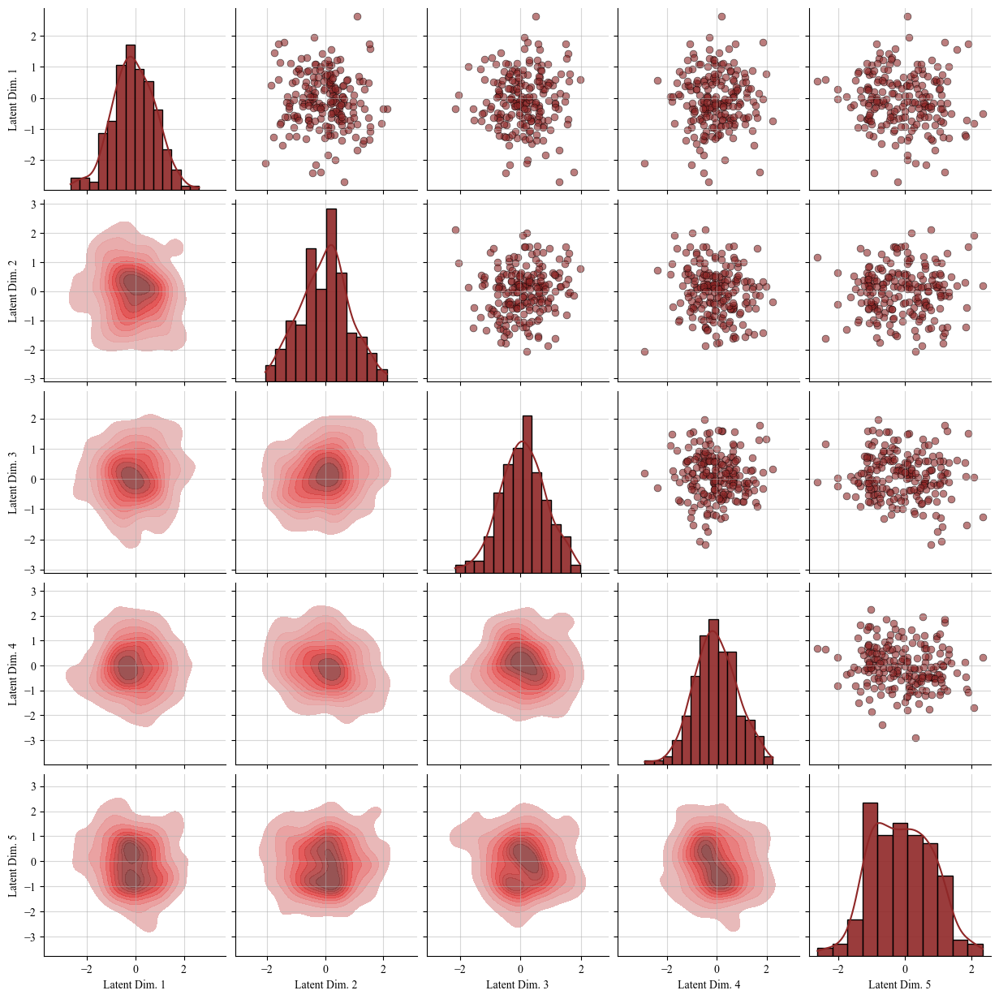

In [97]:
test_sims = trainer.configurator(model(200))
z_samples, _ = amortizer(test_sims)
f = bf.diagnostics.plot_latent_space_2d(z_samples)
plt.savefig(root_dir/"plots/latent dist perfect.pdf", format="pdf", bbox_inches="tight")


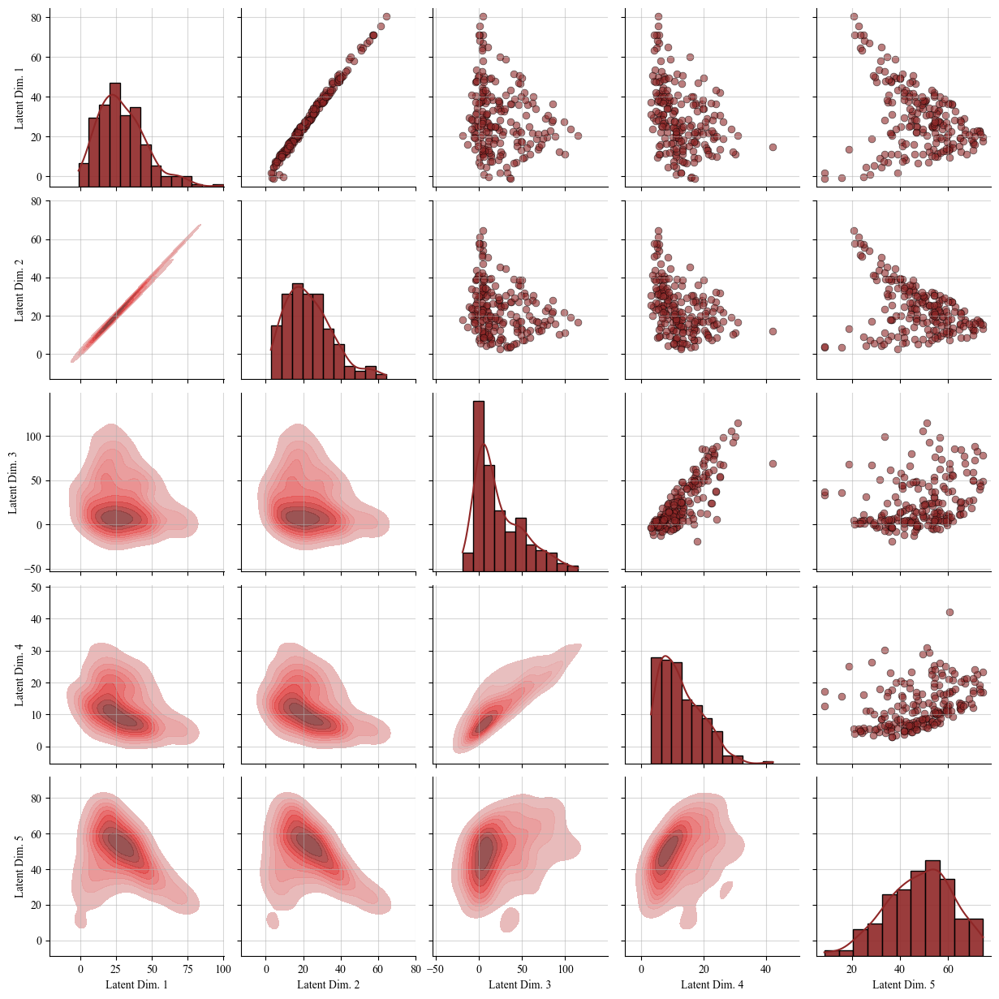

In [98]:
test_sims['summary_conditions'][:,:,0]=np.log(0.01)
z_samples, _ = amortizer(test_sims)
f = bf.diagnostics.plot_latent_space_2d(z_samples)
plt.savefig(root_dir/"plots/latent dist contamination.pdf", format="pdf", bbox_inches="tight")

## Visualization of reaction time data and contamination distribution

In [92]:
#simulate 1000 data sets from the standard model
n=1000
sim_data = model(n)

In [93]:
from scipy.stats import t
from scipy.stats import uniform
x = np.linspace(0,
                t.ppf(0.99, 1), 100)
pdf_df1 = t.pdf(x, 1, loc=0, scale=1)
pdf_df3 = t.pdf(x, 3, loc=0, scale=1)
pdf_df5 = t.pdf(x, 5, loc=0, scale=1)

pdf_uniform = uniform.pdf(x,loc=0,scale=20)


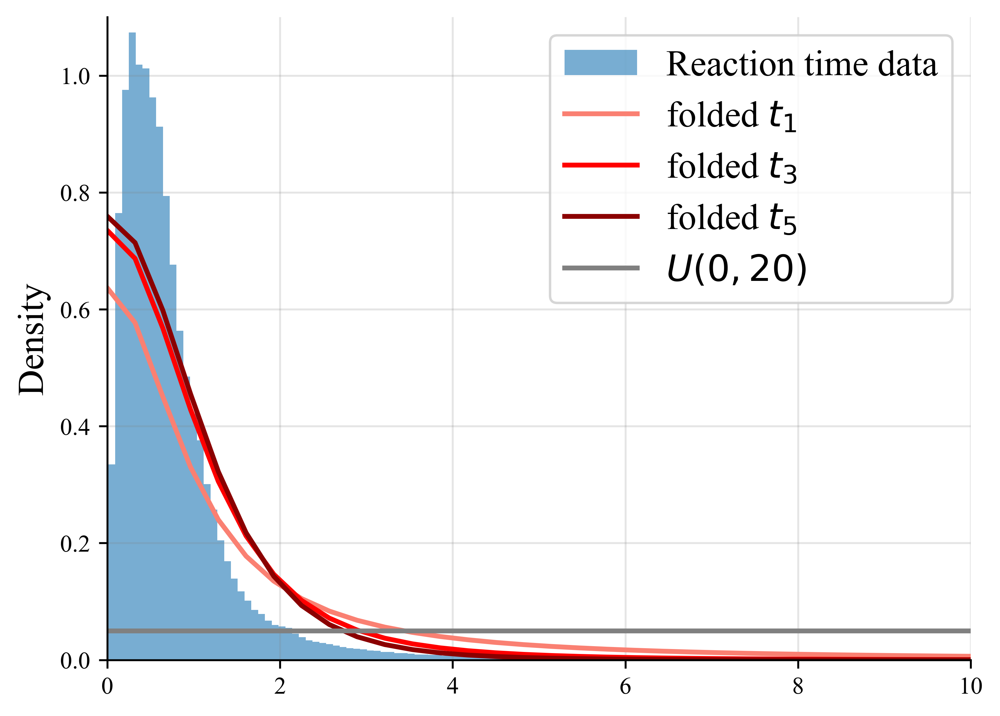

In [99]:
plt.figure(dpi=600)
plt.rcParams['font.family'] = 'Times New Roman'
# Remove top and right spines
ax = plt.gca()  # Get current axis
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.grid(color='grey', linestyle='-',alpha=0.2)
plt.hist(np.exp(sim_data['sim_data'][:,:,0].reshape(500*n,)), bins=200,density=True, alpha=0.6, histtype='stepfilled', label='Reaction time data')
plt.plot(x, 2*pdf_df1, lw=2, color='salmon',label=r'folded $t_1$')
plt.plot(x, 2*pdf_df3, lw=2, color='red',label=r'folded $t_3$')
plt.plot(x, 2*pdf_df5, lw=2, color='darkred',label=r'folded $t_5$')
plt.plot(x, pdf_uniform, lw=2, color='grey',label='$U(0,20)$')
plt.xlim(0, 10)
plt.ylim(0, 1.1)
plt.ylabel('Density', fontsize=15)
plt.legend(fontsize=15)
plt.savefig(root_dir/"plots/rt data and its contamination.pdf", format="pdf", bbox_inches="tight")

plt.show()

## Parameter recovery

### Standard estimator

Estimation will be performed on data sets with 100 simulated trials.


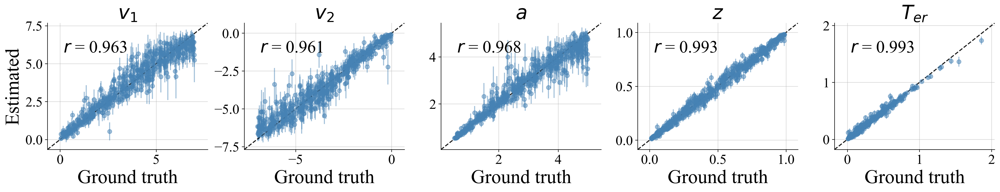

In [17]:
# Generate some validation data
validation_sims = diffusion_configurator(model(batch_size=500))

# Extract unstandardized prior draws and transform to original scale
prior_samples = validation_sims["parameters"] 

print(
    f"Estimation will be performed on data sets with {validation_sims['summary_conditions'].shape[1]} simulated trials."
)

# Generate 100 posterior draws for each of the 1000 simulated data sets
post_samples = amortizer.sample(validation_sims, n_samples=150)
post_samples.shape

plt.rcParams['font.family'] = 'Times New Roman'
f = bf.diagnostics.plot_recovery(
    post_samples, prior_samples, param_names=prior.param_names, point_agg=np.mean, uncertainty_agg=np.std,color='steelblue',add_r2=False,
    label_fontsize=28, title_fontsize=28, metric_fontsize=25, tick_fontsize=20
)
f.set_dpi(300)

plt.savefig(root_dir/"plots/parameter recovery DDM.pdf", format="pdf", bbox_inches="tight")


### Robust estimator (t, df=1)

Estimation will be performed on data sets with 100 simulated trials.


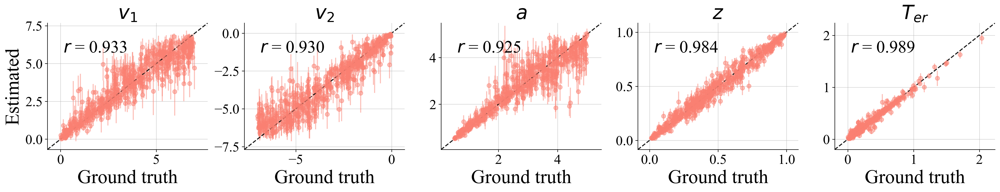

In [18]:
# Generate some validation data
validation_sims = diffusion_configurator(model_t_df1(batch_size=500))

# Extract unstandardized prior draws and transform to original scale
prior_samples = validation_sims["parameters"] 

print(
    f"Estimation will be performed on data sets with {validation_sims['summary_conditions'].shape[1]} simulated trials."
)

# Generate 100 posterior draws for each of the 1000 simulated data sets
post_samples = amortizer_t_df1.sample(validation_sims, n_samples=150)
post_samples.shape

plt.rcParams['font.family'] = 'Times New Roman'
f = bf.diagnostics.plot_recovery(
    post_samples, prior_samples, param_names=prior.param_names, point_agg=np.mean, uncertainty_agg=np.std,color='salmon',add_r2=False,
    label_fontsize=28, title_fontsize=28, metric_fontsize=25, tick_fontsize=20
)
f.set_dpi(300)

plt.savefig(root_dir/"plots/parameter recovery DDM robust df1.pdf", format="pdf", bbox_inches="tight")


### Robust estimator (t, df=3)

Estimation will be performed on data sets with 100 simulated trials.


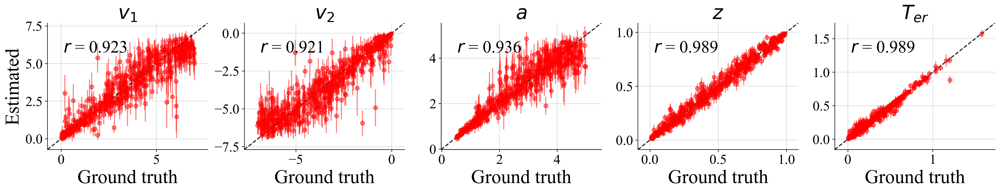

In [19]:
# Generate some validation data
validation_sims = diffusion_configurator(model_t_df3(batch_size=500))

# Extract unstandardized prior draws and transform to original scale
prior_samples = validation_sims["parameters"] 

print(
    f"Estimation will be performed on data sets with {validation_sims['summary_conditions'].shape[1]} simulated trials."
)

# Generate 100 posterior draws for each of the 1000 simulated data sets
post_samples = amortizer_t_df3.sample(validation_sims, n_samples=150)
post_samples.shape

plt.rcParams['font.family'] = 'Times New Roman'
f = bf.diagnostics.plot_recovery(
    post_samples, prior_samples, param_names=prior.param_names, point_agg=np.mean, uncertainty_agg=np.std,color='red',add_r2=False,
    label_fontsize=28, title_fontsize=28, metric_fontsize=25, tick_fontsize=20
)
f.set_dpi(300)

plt.savefig(root_dir/"plots/parameter recovery DDM robust df3.pdf", format="pdf", bbox_inches="tight")


### t df=5

Estimation will be performed on data sets with 100 simulated trials.


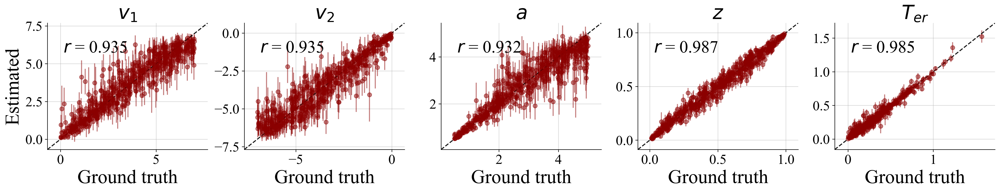

In [20]:
# Generate some validation data
validation_sims = diffusion_configurator(model_t_df5(batch_size=500))

# Extract unstandardized prior draws and transform to original scale
prior_samples = validation_sims["parameters"] 

print(
    f"Estimation will be performed on data sets with {validation_sims['summary_conditions'].shape[1]} simulated trials."
)

# Generate 100 posterior draws for each of the 1000 simulated data sets
post_samples = amortizer_t_df5.sample(validation_sims, n_samples=150)
post_samples.shape

plt.rcParams['font.family'] = 'Times New Roman'
f = bf.diagnostics.plot_recovery(
    post_samples, prior_samples, param_names=prior.param_names, point_agg=np.mean, uncertainty_agg=np.std,color='darkred',add_r2=False,
    label_fontsize=28, title_fontsize=28, metric_fontsize=25, tick_fontsize=20
)
f.set_dpi(300)

plt.savefig(root_dir/"plots/parameter recovery DDM robust df5.pdf", format="pdf", bbox_inches="tight")


### uniform

Estimation will be performed on data sets with 100 simulated trials.


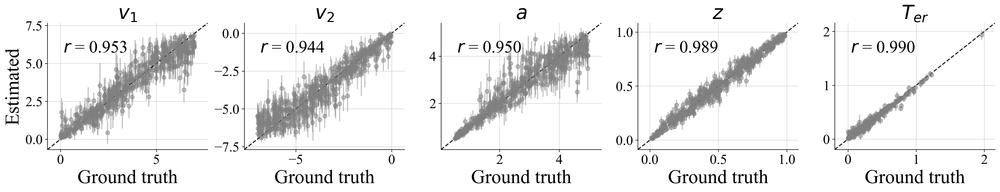

In [21]:
# Generate some validation data
validation_sims = diffusion_configurator(model_uniform(batch_size=500))

# Extract unstandardized prior draws and transform to original scale
prior_samples = validation_sims["parameters"] 

print(
    f"Estimation will be performed on data sets with {validation_sims['summary_conditions'].shape[1]} simulated trials."
)

# Generate 100 posterior draws for each of the 1000 simulated data sets
post_samples = amortizer_uniform.sample(validation_sims, n_samples=150)
post_samples.shape

plt.rcParams['font.family'] = 'Times New Roman'
f = bf.diagnostics.plot_recovery(
    post_samples, prior_samples, param_names=prior.param_names, point_agg=np.mean, uncertainty_agg=np.std,color='grey',add_r2=False,
    label_fontsize=28, title_fontsize=28, metric_fontsize=25, tick_fontsize=20
)
f.set_dpi(300)

plt.savefig(root_dir/"plots/parameter recovery DDM robust uniform.pdf", format="pdf", bbox_inches="tight")


## Empirical influence function (EIF)

In [37]:
def compute_eif(xinfl, model, trainer,batch_size=400,n_samples=150):
    """
    Compute the influence of log-transformed `xinfl` values on the model.
    
    Parameters:
    xinfl (np.array): Array of values for influence calculation.
    model (function): A function to generate model data.
    trainer (object): Trainer object with a `configurator` method.
    
    Returns:
    infl_flip_R (np.array): Array of differences between the posterior means.
    """
    nrx = len(xinfl)
    infl_flip_R = np.zeros(shape=(nrx, 5), dtype=np.float32)
    
    for j in tqdm(range(nrx), desc="Progress", leave=False):
        sim_data = model(batch_size=batch_size)
        sim_data_orig = copy.deepcopy(sim_data)
        sim_data['sim_data'][:, 0, 0] = np.log(xinfl[j])
        sim_data['sim_data'][:, 0, 1] = np.random.binomial(n=1, p=0.5, size=batch_size)
        
        conf_data = trainer.configurator(sim_data)
        conf_data_orig = trainer.configurator(sim_data_orig)
        
        post_samples = amortizer.sample(conf_data, n_samples=n_samples).astype(np.float32)
        avgpost = np.nanmean(amortizer.sample(conf_data, n_samples=n_samples).astype(np.float32), axis=1, dtype=np.float32)
        
        post_samples_orig = amortizer.sample(conf_data_orig, n_samples=n_samples).astype(np.float32)
        avgpost_orig = np.nanmean(post_samples_orig, axis=1, dtype=np.float32)
        
        infl_flip_R[j, :] = np.mean(avgpost, axis=0) - np.mean(avgpost_orig, axis=0)
        
        del sim_data, sim_data_orig, conf_data, conf_data_orig, post_samples, post_samples_orig
        gc.collect()  # Force garbage collection
    
    return infl_flip_R


In [81]:
def plot_empirical_influence(xinfl, infl, ylim,  save_path=None):
    """
    Generate and save a plot for empirical influence data.

    Parameters:
    - xinfl: ndarray
        Array of x-values (e.g., the value of outliers).
    - infl_flip_R: ndarray
        2D array with columns corresponding to the five metrics.
    - save_path: str, optional
        File path to save the figure. If None, the figure is not saved.
    """
    fig, axes = plt.subplots(nrows=1, ncols=5, dpi=300, figsize=(10, 2.3))
    plt.subplots_adjust(hspace=0.4, wspace=0.4)
    plt.rcParams['font.family'] = 'Times New Roman'

    titles = PARAM_NAMES
    
    for i in range(5):
        axes[i].plot(xinfl, infl[:, i], color='steelblue', alpha=0.9)
        axes[i].set_title(titles[i], size = 18)
        axes[2].set_xlabel('Outlier value', size=18)
        axes[0].set_ylabel('EIF', size=18)
        axes[i].set_ylim(ylim[i])

        # Remove top and right spines
        axes[i].spines['top'].set_visible(False)
        axes[i].spines['right'].set_visible(False)

        # Set grey grid
        axes[i].grid(color='grey', linestyle='-', alpha=0.2)

        # Show only bottom and left ticks
        axes[i].xaxis.set_ticks_position('bottom')
        axes[i].yaxis.set_ticks_position('left')

        axes[i].tick_params(axis='x', labelsize=10)
        axes[i].tick_params(axis='y', labelsize=10)

        for spine in axes[i].spines.values():
            spine.set_linewidth(0.4)

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, format="pdf", bbox_inches="tight")
    plt.show()


## Breakdown point (BP)

In [29]:
def compute_bp(ninfl, model, amortizer, trainer, x_c, batch_size=400,n_samples=150):
   
    nrx = len(ninfl)
    infl_flip_R_bp = np.zeros(shape=(nrx, 5), dtype=np.float32)
    
    for j in tqdm(range(nrx), desc="Progress", leave=False):
        sim_data = model(batch_size=batch_size)
        sim_data['sim_data'][:,0:ninfl[j],0] = np.log(x_c)
        sim_data['sim_data'][:,0:ninfl[j],1] = np.random.binomial(n=1, p=0.5, size=(batch_size,ninfl[j]))
        
        conf_data = trainer.configurator(sim_data)
        
        post_samples = amortizer.sample(conf_data, n_samples=n_samples).astype(np.float32)
        avgpost = np.nanmean(amortizer.sample(conf_data, n_samples=n_samples).astype(np.float32), axis=1, dtype=np.float32)
        
        infl_flip_R_bp[j, :] = np.mean(avgpost, axis=0)
        
        del sim_data, conf_data, post_samples
        gc.collect()  # Force garbage collection
    
    return infl_flip_R_bp

In [30]:
def plot_breakdown_point(ninfl, infl_flip_R_bp, no_infl, save_path=None):
    """
    Generate and save a plot for estimation data with highlighted regions and horizontal lines.

    Parameters:
    - ninfl: ndarray
        Array of x-values (e.g., the number of outliers).
    - infl_flip_R_bp_20: ndarray
        2D array with columns corresponding to the five metrics.
    - no_infl: list or ndarray
        True values for the horizontal reference lines (one for each plot).
    - save_path: str, optional
        File path to save the figure. If None, the figure is not saved.
    """
    fig, axes = plt.subplots(nrows=1, ncols=5, dpi=300, figsize=(10, 2.3))
    plt.subplots_adjust(hspace=0.4, wspace=0.4)
    plt.rcParams['font.family'] = 'Times New Roman'

    ylim = [(-8, 8), (-8, 8), (-1, 10), (0, 1), (-1.5, 1.5)]
    hspan = [(0, 7), (-7, 0), (0.5, 5), (0.01, 0.99), (0, 1)]
    titles = PARAM_NAMES

    for i in range(5):
        axes[i].plot(np.arange(0, 1.00, 0.02), infl_flip_R_bp[:50, i], color='steelblue', alpha=0.9)
        axes[i].set_title(titles[i], size = 18)
        axes[2].set_xlabel('Outlier fraction', size=18)
        axes[0].set_ylabel('Estimation', size=18)
        axes[i].set_ylim(ylim[i])
        axes[i].set_xticks(np.arange(0, 1.1, 0.5))
        
        # Add horizontal line
        axes[i].axhline(y=no_infl[i], color='red', linestyle='--', label='Horizontal Line')

        # Add highlighted region
        axes[i].axhspan(hspan[i][0], hspan[i][1], color='lightgrey', alpha=0.5)

        # Remove top and right spines
        axes[i].spines['top'].set_visible(False)
        axes[i].spines['right'].set_visible(False)

        # Set grey grid
        axes[i].grid(color='grey', linestyle='-', alpha=0.2)

        # Show only bottom and left ticks
        axes[i].xaxis.set_ticks_position('bottom')
        axes[i].yaxis.set_ticks_position('left')

        axes[i].tick_params(axis='x', labelsize=10)
        axes[i].tick_params(axis='y', labelsize=10)

        for spine in axes[i].spines.values():
            spine.set_linewidth(0.4)

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, format="pdf", bbox_inches="tight")
    plt.show()

## EIF of standard estimators

In [ ]:
#outliers range from 0.01 to 20s
xinfl = np.arange(0.01, 20, 0.05)
infl_flip_R = compute_eif(xinfl, model=model, trainer=trainer)

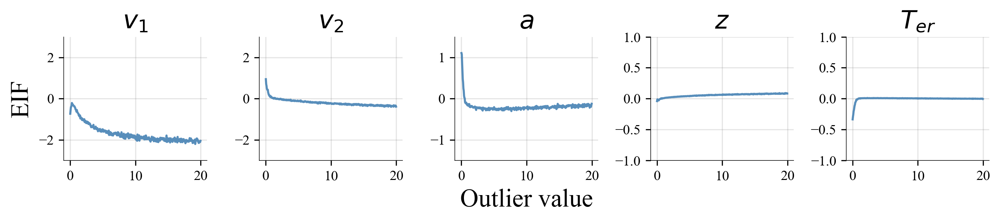

In [83]:
# Create the figure and axes
ylim = [[-3,3],[-3,3],[-1.5,1.5],[-1,1],[-1,1]]
xinfl = np.arange(0.01, 20, 0.05)
plot_empirical_influence(xinfl, infl = infl_flip_R, ylim = ylim, save_path=root_dir/"plots/EIF DDM.pdf")


In [ ]:
#outliers range from 0.01 to 1s
xinfl = np.arange(0.01, 1.01, 0.01)
infl_flip_R_01 = compute_eif(xinfl=xinfl, model=model, trainer=trainer)

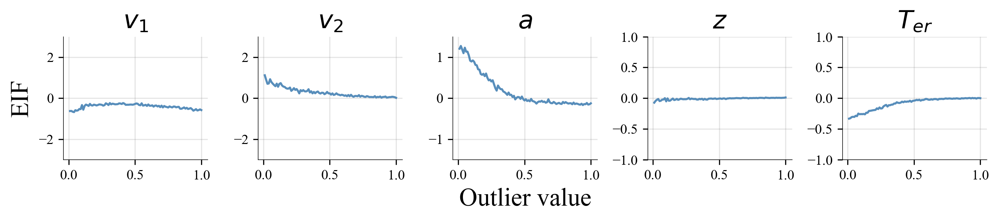

In [84]:
# Create the figure and axes
ylim = [[-3,3],[-3,3],[-1.5,1.5],[-1,1],[-1,1]]
xinfl = np.arange(0.01, 1.01, 0.01)
plot_empirical_influence(xinfl, infl = infl_flip_R_01, ylim = ylim, save_path=root_dir/"plots/EIF DDM 1s.pdf")


## BP of standard estimators

In [ ]:
ninfl = np.arange(1, 101, 1)
infl_flip_R_bp = compute_bp(ninfl = infl, model = model, trainer = trainer, x_c=0.01)

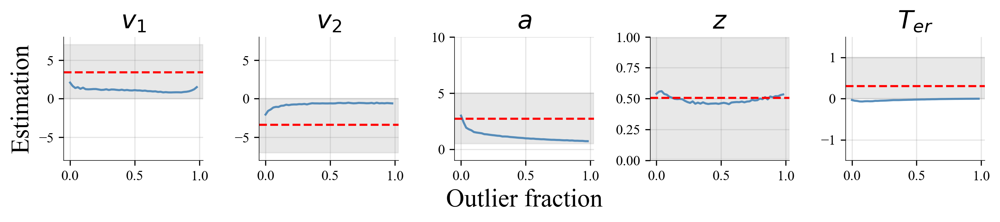

In [85]:
# Create the figure and axes
ninfl = np.arange(1, 101, 1)
sim_data = model(batch_size=500)
post_sample_orig = amortizer.sample(trainer.configurator(sim_data), n_samples=150)
no_infl = np.mean(np.mean(post_sample_orig, axis=1), axis=0)

plot_breakdown_point(ninfl = ninfl, no_infl = no_infl, infl_flip_R_bp=infl_flip_R_bp, save_path =root_dir/"plots/BP DDM.pdf")


In [ ]:
ninfl = np.arange(1, 101, 1)
infl_flip_R_bp = compute_bp(ninfl = infl, model = model, trainer = trainer, x_c=20)
#%store infl_flip_R_bp

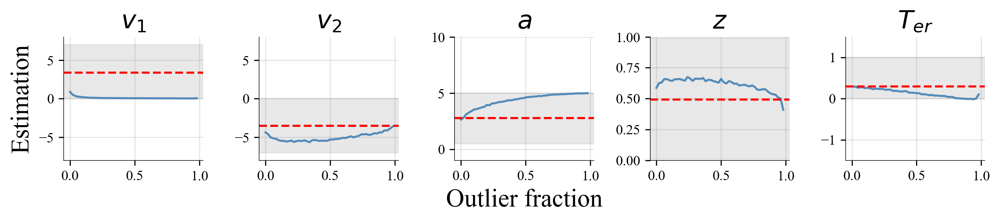

In [86]:
# Create the figure and axes
%store -r infl_flip_R_bp_20
ninfl = np.arange(1, 101, 1)
sim_data = model(batch_size=500)
post_sample_orig = amortizer.sample(trainer.configurator(sim_data), n_samples=150)
no_infl = np.mean(np.mean(post_sample_orig, axis=1), axis=0)

plot_breakdown_point(ninfl = ninfl, no_infl = no_infl, infl_flip_R_bp=infl_flip_R_bp_20, save_path = root_dir/"plots/BP DDM 20s.pdf")


## EIF of robust estimators

In [ ]:
#outliers range from 0.01 to 20
xinfl = np.arange(0.01, 20, 0.05)
infl_flip_R_uniform = compute_eif(xinfl, model=model_uniform, trainer=trainer_uniform)
infl_flip_R_t_df1 = compute_eif(xinfl, model=model_t_df1, trainer=trainer_t_df1)
infl_flip_R_t_df3 = compute_eif(xinfl, model=model_t_df3, trainer=trainer_t_df3)
infl_flip_R_t_df5 = compute_eif(xinfl, model=model_t_df5, trainer=trainer_t_df5)

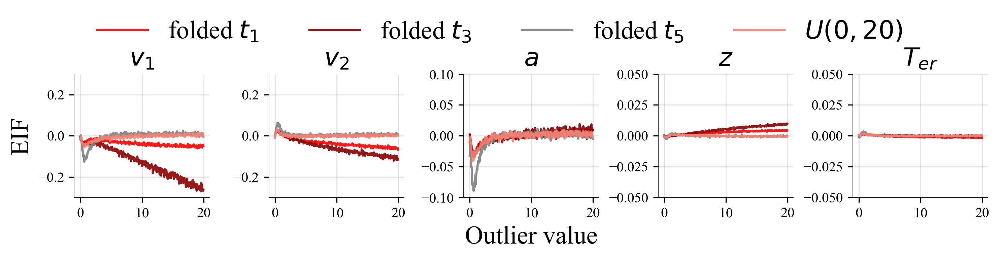

In [91]:
# Create the figure and axes
xinfl = np.arange(0.01, 20, 0.05)
fig, axes = plt.subplots(nrows=1, ncols=5, dpi=300, figsize=(10, 2.3))
plt.subplots_adjust(hspace=0.4, wspace=0.4)
plt.rcParams['font.family'] = 'Times New Roman'
ylim = [[-0.3,0.3],[-0.3,0.3],[-0.1,0.1],[-0.05,0.05],[-0.05,0.05]]
# Plot data and diagonal lines
for i in range(5):
    axes[i].plot(xinfl, infl_flip_R_t_df3[:,i], color='red',alpha=0.9)
    axes[i].plot(xinfl, infl_flip_R_t_df5[:,i], color='darkred',alpha=0.9)
    axes[i].plot(xinfl, infl_flip_R_uniform[:,i], color='grey',alpha=0.9)
    axes[i].plot(xinfl, infl_flip_R_t_df1[:,i], color='salmon',alpha=0.9)
    axes[i].set_title(PARAM_NAMES[i], size=18)
    axes[2].set_xlabel('Outlier value', size=18)
    axes[0].set_ylabel('EIF', size=18)
    axes[i].set_ylim(ylim[i])
    

    # Remove top and right spines
    axes[i].spines['top'].set_visible(False)
    axes[i].spines['right'].set_visible(False)

    # Set grey grid
    axes[i].grid(color='grey', linestyle='-',alpha=0.2)

    # Show only bottom and left ticks
    axes[i].xaxis.set_ticks_position('bottom')
    axes[i].yaxis.set_ticks_position('left')
    
    axes[i].tick_params(axis='x', labelsize=10)
    axes[i].tick_params(axis='y', labelsize=10)
    
    for spine in axes[i].spines.values():
        spine.set_linewidth(0.4)  # Adjust the line width here

fig.legend([r'folded $t_1$', r'folded $t_3$', r'folded $t_5$',r'$U(0,20)$'], loc='upper center',ncol=4, fontsize=18, bbox_to_anchor=(0.5, 1.15), frameon=False)

plt.tight_layout()

plt.savefig(root_dir/"plots/EIF DDM Robust.pdf", format="pdf", bbox_inches="tight")
plt.show()


In [ ]:
#outliers range from 0.01 to 1
xinfl = np.arange(0.01, 1, 0.01)
infl_flip_R_uniform_01 = compute_eif(xinfl, model=model_uniform, trainer=trainer_uniform)
infl_flip_R_t_df1_01 = compute_eif(xinfl, model=model_t_df1, trainer=trainer_t_df1)
infl_flip_R_t_df3_01 = compute_eif(xinfl, model=model_t_df3, trainer=trainer_t_df3)
infl_flip_R_t_df5_01 = compute_eif(xinfl, model=model_t_df5, trainer=trainer_t_df5)

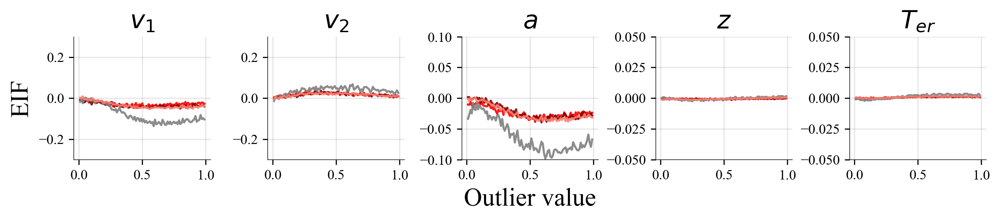

In [88]:
# Create the figure and axes
xinfl = np.arange(0.01, 1, 0.01)
fig, axes = plt.subplots(nrows=1, ncols=5, dpi=300, figsize=(10, 2.3))
plt.subplots_adjust(hspace=0.4, wspace=0.4)
plt.rcParams['font.family'] = 'Times New Roman'
ylim = [[-0.3,0.3],[-0.3,0.3],[-0.1,0.1],[-0.05,0.05],[-0.05,0.05]]
# Plot data and diagonal lines
for i in range(5):
    axes[i].plot(xinfl, infl_flip_R_t_df3_01[:,i], color='red',alpha=0.9)
    axes[i].plot(xinfl, infl_flip_R_t_df5_01[:,i], color='darkred',alpha=0.9)
    axes[i].plot(xinfl, infl_flip_R_uniform_01[:,i], color='grey',alpha=0.9)
    axes[i].plot(xinfl, infl_flip_R_t_df1_01[:,i], color='salmon',alpha=0.9)
    axes[i].set_title(PARAM_NAMES[i], size=18)
    axes[2].set_xlabel('Outlier value', size=18)
    axes[0].set_ylabel('EIF', size=18)
    axes[i].set_ylim(ylim[i])
    

    # Remove top and right spines
    axes[i].spines['top'].set_visible(False)
    axes[i].spines['right'].set_visible(False)

    # Set grey grid
    axes[i].grid(color='grey', linestyle='-',alpha=0.2)

    # Show only bottom and left ticks
    axes[i].xaxis.set_ticks_position('bottom')
    axes[i].yaxis.set_ticks_position('left')
    
    axes[i].tick_params(axis='x', labelsize=10)
    axes[i].tick_params(axis='y', labelsize=10)
    
    for spine in axes[i].spines.values():
        spine.set_linewidth(0.4)  # Adjust the line width here

#fig.legend([r'folded $t_1$', r'folded $t_3$', r'folded $t_5$',r'$U(0,20)$'], loc='upper center',ncol=4, fontsize=12, bbox_to_anchor=(0.5, 1.15), frameon=False)

plt.tight_layout()

plt.savefig(root_dir/"plots/EIF of DDM robust 0-1.pdf", format="pdf", bbox_inches="tight")
plt.show()


## BP of robust estimators

In [ ]:
ninfl = np.arange(1, 101, 1)
bp_t_df1 = compute_bp(ninfl = infl, model = model_t_df1, trainer = trainer_t_df1, x_c=0.01)
bp_t_df3 = compute_bp(ninfl = infl, model = model_t_df3, trainer = trainer_t_df3, x_c=0.01)
bp_t_df5 = compute_bp(ninfl = infl, model = model_t_df5, trainer = trainer_t_df5, x_c=0.01)
bp_uniform = compute_bp(ninfl = infl, model = model_uniform, trainer = trainer_uniform, x_c=0.01)

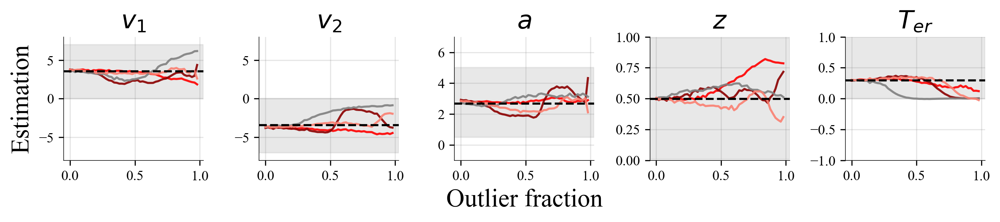

In [89]:
no_infl = np.mean(np.mean(amortizer.sample(trainer.configurator(model(1000)), n_samples=1000),axis=1),axis=0)
fig, axes = plt.subplots(nrows=1, ncols=5, dpi=300, figsize=(10, 2.3))
ylim = [(-8,8),(-8,8),(-1,7),(0,1),(-1,1)]
hspan = [(0,7),(-7,0),(0.5,5),(0.01,0.99),(0,2)]
# Plot data and diagonal lines
for i in range(5):
    axes[i].plot(np.arange(0, 1.00, 0.02), bp_t_df3[0:50,i], color='red',alpha=0.9)
    axes[i].plot(np.arange(0, 1.00, 0.02), bp_t_df5[0:50,i], color='darkred',alpha=0.9)
    axes[i].plot(np.arange(0, 1.00, 0.02), bp_uniform[0:50,i], color='grey',alpha=0.9)
    axes[i].plot(np.arange(0, 1.00, 0.02), bp_t_df1[0:50,i], color='salmon',alpha=0.9)
    axes[i].set_title(PARAM_NAMES[i], size=18)
    axes[2].set_xlabel('Outlier fraction', size=18)
    axes[0].set_ylabel('Estimation', size=18)
    axes[i].set_ylim(ylim[i])
    axes[i].axhline(y=no_infl[i], color='black', linestyle='--', label='Horizontal Line at x=a')


    # Remove top and right spines
    axes[i].spines['top'].set_visible(False)
    axes[i].spines['right'].set_visible(False)

    # Set grey grid
    axes[i].grid(color='grey', linestyle='-',alpha=0.2)

    # Show only bottom and left ticks
    axes[i].xaxis.set_ticks_position('bottom')
    axes[i].yaxis.set_ticks_position('left')
    
    axes[i].tick_params(axis='x', labelsize=10)
    axes[i].tick_params(axis='y', labelsize=10)
    
    for spine in axes[i].spines.values():
        spine.set_linewidth(0.4)  # Adjust the line width here
    axes[i].axhspan(hspan[i][0],hspan[i][1], color='lightgrey', alpha=0.5)

    #fig.legend([r'folded $t_1$', r'folded $t_3$', r'folded $t_5$',r'$U(0,20)$'], loc='upper center',ncol=4, fontsize=12, bbox_to_anchor=(0.5, 1.15), frameon=False)

plt.tight_layout()

plt.savefig(root_dir/"plots/BP DDM robust.pdf", format="pdf", bbox_inches="tight")
plt.show()

### Robust estimators Breakdown point 20s

In [ ]:
ninfl = np.arange(1, 101, 1)
bp_t_df1_20 = compute_bp(ninfl = infl, model = model_t_df1, trainer = trainer_t_df1, x_c=20)
bp_t_df3_20 = compute_bp(ninfl = infl, model = model_t_df3, trainer = trainer_t_df3, x_c=20)
bp_t_df5_20 = compute_bp(ninfl = infl, model = model_t_df5, trainer = trainer_t_df5, x_c=20)
bp_uniform_20 = compute_bp(ninfl = infl, model = model_uniform, trainer = trainer_uniform, x_c=20)

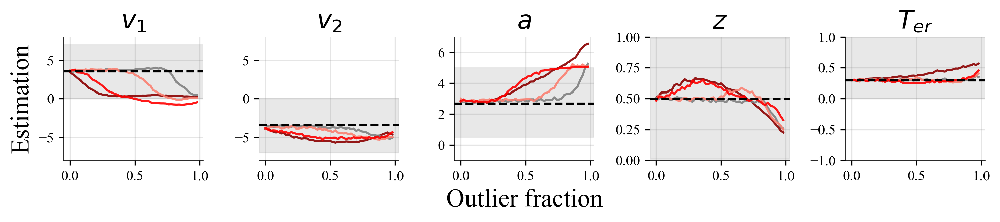

In [90]:
fig, axes = plt.subplots(nrows=1, ncols=5, dpi=300, figsize=(10, 2.3))
ylim = [(-8,8),(-8,8),(-1,7),(0,1),(-1,1)]
hspan = [(0,7),(-7,0),(0.5,5),(0.01,0.99),(0,2)]
# Plot data and diagonal lines
for i in range(5):
    axes[i].plot(np.arange(0, 1.00, 0.02), bp_t_df5_20[0:50,i], color='darkred',alpha=0.9)
    axes[i].plot(np.arange(0, 1.00, 0.02), bp_uniform_20[0:50,i], color='grey',alpha=0.9)
    axes[i].plot(np.arange(0, 1.00, 0.02), bp_t_df1_20[0:50,i], color='salmon',alpha=0.9)
    axes[i].plot(np.arange(0, 1.00, 0.02), bp_t_df3_20[0:50,i], color='red',alpha=0.9)
    axes[i].set_title(PARAM_NAMES[i], size=18)
    axes[2].set_xlabel('Outlier fraction', size=18)
    axes[0].set_ylabel('Estimation', size=18)
    axes[i].set_ylim(ylim[i])
    axes[i].axhline(y=no_infl[i], color='black', linestyle='--', label='Horizontal Line at x=a')


    # Remove top and right spines
    axes[i].spines['top'].set_visible(False)
    axes[i].spines['right'].set_visible(False)

    # Set grey grid
    axes[i].grid(color='grey', linestyle='-',alpha=0.2)

    # Show only bottom and left ticks
    axes[i].xaxis.set_ticks_position('bottom')
    axes[i].yaxis.set_ticks_position('left')
    
    axes[i].tick_params(axis='x', labelsize=10)
    axes[i].tick_params(axis='y', labelsize=10)
    
    for spine in axes[i].spines.values():
        spine.set_linewidth(0.4)  # Adjust the line width here
    axes[i].axhspan(hspan[i][0],hspan[i][1], color='lightgrey', alpha=0.5)

    #fig.legend([r'folded $t_1$', r'folded $t_3$', r'folded $t_5$',r'$U(0,20)$'], loc='upper center',ncol=4, fontsize=12, bbox_to_anchor=(0.5, 1.15), frameon=False)

plt.tight_layout()

plt.savefig(root_dir/"plots/BP DDM 20s robust.pdf", format="pdf", bbox_inches="tight")
plt.show()

## The cost of robustness

### Mean absolute error and posterior variance

In [68]:
test_sims = model(batch_size=10000)
def cost(amortizer, n_samples=200):
    post_samples = amortizer.sample(trainer.configurator(test_sims), n_samples=n_samples)
    post_samples_mean = np.mean(post_samples,axis=1)
    true_parameters =  test_sims['prior_draws']
    MAE = np.nanmean(np.abs(true_parameters-post_samples_mean),axis=0)
    VAR = np.nanmean(np.var(post_samples,axis=1),axis=0)
    
    return MAE, VAR

In [69]:
#when estimating clean data
MAE_ddm_standard, VAR_ddm_standard = cost(amortizer=amortizer)
MAE_ddm_df1, VAR_ddm_df1 = cost(amortizer=amortizer_t_df1)
MAE_ddm_df3, VAR_ddm_df3 = cost(amortizer=amortizer_t_df3)
MAE_ddm_df5, VAR_ddm_df5 = cost(amortizer=amortizer_t_df5)
MAE_uniform, VAR_uniform = cost(amortizer=amortizer_uniform)

In [72]:
print(f'ErrorRatio t_1', np.round(MAE_ddm_standard/MAE_ddm_df1,3))
print(f'ErrorRatio t_3', np.round(MAE_ddm_standard/MAE_ddm_df3,3))
print(f'ErrorRatio t_5', np.round(MAE_ddm_standard/MAE_ddm_df5,3))
print(f'ErrorRatio U(0,20)', np.round(MAE_ddm_standard/MAE_uniform,3))

print(f'VarRatio t_1', np.round(VAR_ddm_standard/VAR_ddm_df1,3))
print(f'VarRatio t_3', np.round(VAR_ddm_standard/VAR_ddm_df3,3))
print(f'VarRatio t_5', np.round(VAR_ddm_standard/VAR_ddm_df5,3))
print(f'VarRatio U(0,20)', np.round(VAR_ddm_standard/VAR_uniform,3))

ErrorRatio t_1 [0.76  0.79  0.769 0.88  0.792]
ErrorRatio t_3 [0.731 0.722 0.728 0.865 0.764]
ErrorRatio t_5 [0.728 0.74  0.734 0.862 0.733]
ErrorRatio U(0,20) [0.876 0.894 0.907 0.936 0.848]
VarRatio t_1 [0.613 0.596 0.621 0.732 0.571]
VarRatio t_3 [0.637 0.569 0.634 0.694 0.581]
VarRatio t_5 [0.618 0.569 0.672 0.713 0.568]
VarRatio U(0,20) [0.723 0.672 0.723 0.756 0.636]


## Manipulate contamination probability $\pi$

In [23]:
##pi=0.01
def diffusion_experiment_001(theta, design_matrix, num_obs, rng=None, *args):
    out = np.zeros((num_obs, 2))
    for n in range(num_obs):
        index = design_matrix[n]
        rt,resp = diffusion_trial(theta[index], theta[-3], theta[-2], theta[-1])
        out[n, :] = np.array([rt,resp])
    
    #log transformation
    out[:,0] = np.log(out[:,0])
    
    CC=np.random.standard_t(df=1,size=num_obs)
    X=np.random.binomial(n=1,p=.01,size=num_obs)
    out[:,0] = (1-X)*out[:,0] + (X)*np.log(np.abs(CC))
    out[:,1] = (1-X)*out[:,1] + (X)*np.random.binomial(n=1,p=0.5,size=num_obs)
    
    return out

simulator_001 = bf.simulation.Simulator(simulator_fun=diffusion_experiment_001, context_generator=context_gen)

model_001 = bf.simulation.GenerativeModel(prior=prior, simulator=simulator_001)


#SetTransformer() is a permutation invariant network
#input_dim = how many dimensions the configured data would have
#here we have a RT, dummy coded variable for the two choices (one or two?), the context dummy
summary_net_001 = bf.networks.SetTransformer(input_dim=4, summary_dim=12)

#we are turning off the kernel and dropout regularization for the networks 
#since we don’t need these for online training
inference_net_001 = bf.networks.InvertibleNetwork(
    num_params=len(prior.param_names),
    coupling_design="interleaved"
)

amortizer_001 = bf.amortizers.AmortizedPosterior(inference_net_001, summary_net_001)


trainer_001 = bf.trainers.Trainer(
    generative_model=model_001, amortizer=amortizer_001, configurator=diffusion_configurator,
    checkpoint_path = checkpoint_path_001
)
amortizer_001.summary()

##pi=0.05
@nb.jit(nopython=True)

def diffusion_experiment_005(theta, design_matrix, num_obs, rng=None, *args):
    out = np.zeros((num_obs, 2))
    for n in range(num_obs):
        index = design_matrix[n]
        rt,resp = diffusion_trial(theta[index], theta[-3], theta[-2], theta[-1])
        out[n, :] = np.array([rt,resp])
    
    #log transformation
    out[:,0] = np.log(out[:,0])
    
    CC=np.random.standard_t(df=1,size=num_obs)
    X=np.random.binomial(n=1,p=.05,size=num_obs)
    out[:,0] = (1-X)*out[:,0] + (X)*np.log(np.abs(CC))
    out[:,1] = (1-X)*out[:,1] + (X)*np.random.binomial(n=1,p=0.5,size=num_obs)
    
    return out

simulator_005 = bf.simulation.Simulator(simulator_fun=diffusion_experiment_005, context_generator=context_gen)

model_005 = bf.simulation.GenerativeModel(prior=prior, simulator=simulator_005)

from tensorflow_probability import distributions as tfd
import tensorflow as tf
#SetTransformer() is a permutation invariant network
#input_dim = how many dimensions the configured data would have
#here we have a RT, dummy coded variable for the two choices (one or two?), the context dummy
summary_net_005 = bf.networks.SetTransformer(input_dim=4, summary_dim=12)

#we are turning off the kernel and dropout regularization for the networks 
#since we don’t need these for online training
inference_net_005 = bf.networks.InvertibleNetwork(
    num_params=len(prior.param_names),
    coupling_design="interleaved"
)

amortizer_005 = bf.amortizers.AmortizedPosterior(inference_net_005, summary_net_005)


trainer_005 = bf.trainers.Trainer(
    generative_model=model_005, amortizer=amortizer_005, configurator=diffusion_configurator,
    checkpoint_path = checkpoint_path_005
)
amortizer_005.summary()

##pi=0.1
@nb.jit(nopython=True)

def diffusion_experiment_010(theta, design_matrix, num_obs, rng=None, *args):
    out = np.zeros((num_obs, 2))
    for n in range(num_obs):
        index = design_matrix[n]
        rt,resp = diffusion_trial(theta[index], theta[-3], theta[-2], theta[-1])
        out[n, :] = np.array([rt,resp])
    
    #log transformation
    out[:,0] = np.log(out[:,0])
    
    CC=np.random.standard_t(df=1,size=num_obs)
    X=np.random.binomial(n=1,p=.1,size=num_obs)
    out[:,0] = (1-X)*out[:,0] + (X)*np.log(np.abs(CC))
    out[:,1] = (1-X)*out[:,1] + (X)*np.random.binomial(n=1,p=0.5,size=num_obs)
    
    return out

simulator_010 = bf.simulation.Simulator(simulator_fun=diffusion_experiment_010, context_generator=context_gen)

model_010 = bf.simulation.GenerativeModel(prior=prior, simulator=simulator_010)

from tensorflow_probability import distributions as tfd
import tensorflow as tf
#SetTransformer() is a permutation invariant network
#input_dim = how many dimensions the configured data would have
#here we have a RT, dummy coded variable for the two choices (one or two?), the context dummy
summary_net_010 = bf.networks.SetTransformer(input_dim=4, summary_dim=12)

#we are turning off the kernel and dropout regularization for the networks 
#since we don’t need these for online training
inference_net_010 = bf.networks.InvertibleNetwork(
    num_params=len(prior.param_names),
    coupling_design="interleaved"
)

amortizer_010 = bf.amortizers.AmortizedPosterior(inference_net_010, summary_net_010)


trainer_010 = bf.trainers.Trainer(
    generative_model=model_010, amortizer=amortizer_010, configurator=diffusion_configurator,
    checkpoint_path = checkpoint_path_010
)
amortizer_010.summary()

##pi=0.2

@nb.jit(nopython=True)

def diffusion_experiment_020(theta, design_matrix, num_obs, rng=None, *args):
    out = np.zeros((num_obs, 2))
    for n in range(num_obs):
        index = design_matrix[n]
        rt,resp = diffusion_trial(theta[index], theta[-3], theta[-2], theta[-1])
        out[n, :] = np.array([rt,resp])
    
    #log transformation
    out[:,0] = np.log(out[:,0])
    
    CC=np.random.standard_t(df=1,size=num_obs)
    X=np.random.binomial(n=1,p=.20,size=num_obs)
    out[:,0] = (1-X)*out[:,0] + (X)*np.log(np.abs(CC))
    out[:,1] = (1-X)*out[:,1] + (X)*np.random.binomial(n=1,p=0.5,size=num_obs)
    
    return out

simulator_020 = bf.simulation.Simulator(simulator_fun=diffusion_experiment_020, context_generator=context_gen)

model_020 = bf.simulation.GenerativeModel(prior=prior, simulator=simulator_020)

from tensorflow_probability import distributions as tfd
import tensorflow as tf
#SetTransformer() is a permutation invariant network
#input_dim = how many dimensions the configured data would have
#here we have a RT, dummy coded variable for the two choices (one or two?), the context dummy
summary_net_020 = bf.networks.SetTransformer(input_dim=4, summary_dim=12)

#we are turning off the kernel and dropout regularization for the networks 
#since we don’t need these for online training
inference_net_020 = bf.networks.InvertibleNetwork(
    num_params=len(prior.param_names),
    coupling_design="interleaved"
)

amortizer_020 = bf.amortizers.AmortizedPosterior(inference_net_020, summary_net_020)


trainer_020 = bf.trainers.Trainer(
    generative_model=model_020, amortizer=amortizer_020, configurator=diffusion_configurator,
    checkpoint_path = checkpoint_path_020
)
amortizer_020.summary()

INFO:root:Performing 2 pilot runs with the anonymous model...
INFO:root:Shape of parameter batch after 2 pilot simulations: (batch_size = 2, 5)
INFO:root:Shape of simulation batch after 2 pilot simulations: (batch_size = 2, 100, 2)
INFO:root:No optional prior non-batchable context provided.
INFO:root:No optional prior batchable context provided.
INFO:root:Could not determine shape of simulation non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Could not determine shape of simulation batchable context. Type appears to be non-array: <class 'list'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Loaded loss history from C:\Users\u0145642\OneDrive - KU Leuven\Desktop\Robust amortized Bayesian inference\3 ddm\networks\contamination probability\pi=0.01\history_100.pkl.
INFO:root:Networks loaded from C:\Users\u0145642\

Model: "amortized_posterior_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 invertible_network_1 (Inve  multiple                  434037    
 rtibleNetwork)                                                  
                                                                 
 set_transformer_6 (SetTran  multiple                  46544     
 sformer)                                                        
                                                                 
Total params: 480581 (1.83 MB)
Trainable params: 480521 (1.83 MB)
Non-trainable params: 60 (240.00 Byte)
_________________________________________________________________


INFO:root:Performing 2 pilot runs with the anonymous model...
INFO:root:Shape of parameter batch after 2 pilot simulations: (batch_size = 2, 5)
INFO:root:Shape of simulation batch after 2 pilot simulations: (batch_size = 2, 100, 2)
INFO:root:No optional prior non-batchable context provided.
INFO:root:No optional prior batchable context provided.
INFO:root:Could not determine shape of simulation non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Could not determine shape of simulation batchable context. Type appears to be non-array: <class 'list'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Loaded loss history from C:\Users\u0145642\OneDrive - KU Leuven\Desktop\Robust amortized Bayesian inference\3 ddm\networks\contamination probability\pi=0.05\history_101.pkl.
INFO:root:Networks loaded from C:\Users\u0145642\

Model: "amortized_posterior_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 invertible_network_2 (Inve  multiple                  434037    
 rtibleNetwork)                                                  
                                                                 
 set_transformer_7 (SetTran  multiple                  46544     
 sformer)                                                        
                                                                 
Total params: 480581 (1.83 MB)
Trainable params: 480521 (1.83 MB)
Non-trainable params: 60 (240.00 Byte)
_________________________________________________________________


INFO:root:Performing 2 pilot runs with the anonymous model...
INFO:root:Shape of parameter batch after 2 pilot simulations: (batch_size = 2, 5)
INFO:root:Shape of simulation batch after 2 pilot simulations: (batch_size = 2, 100, 2)
INFO:root:No optional prior non-batchable context provided.
INFO:root:No optional prior batchable context provided.
INFO:root:Could not determine shape of simulation non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Could not determine shape of simulation batchable context. Type appears to be non-array: <class 'list'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Loaded loss history from C:\Users\u0145642\OneDrive - KU Leuven\Desktop\Robust amortized Bayesian inference\3 ddm\networks\contamination probability\pi=0.10\history_100.pkl.
INFO:root:Networks loaded from C:\Users\u0145642\

Model: "amortized_posterior_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 invertible_network_3 (Inve  multiple                  434037    
 rtibleNetwork)                                                  
                                                                 
 set_transformer_8 (SetTran  multiple                  46544     
 sformer)                                                        
                                                                 
Total params: 480581 (1.83 MB)
Trainable params: 480521 (1.83 MB)
Non-trainable params: 60 (240.00 Byte)
_________________________________________________________________


INFO:root:Performing 2 pilot runs with the anonymous model...
INFO:root:Shape of parameter batch after 2 pilot simulations: (batch_size = 2, 5)
INFO:root:Shape of simulation batch after 2 pilot simulations: (batch_size = 2, 100, 2)
INFO:root:No optional prior non-batchable context provided.
INFO:root:No optional prior batchable context provided.
INFO:root:Could not determine shape of simulation non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Could not determine shape of simulation batchable context. Type appears to be non-array: <class 'list'>,                                    so make sure your input configurator takes cares of that!
INFO:root:Loaded loss history from C:\Users\u0145642\OneDrive - KU Leuven\Desktop\Robust amortized Bayesian inference\3 ddm\networks\contamination probability\pi=0.20\history_100.pkl.
INFO:root:Networks loaded from C:\Users\u0145642\

Model: "amortized_posterior_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 invertible_network_4 (Inve  multiple                  434037    
 rtibleNetwork)                                                  
                                                                 
 set_transformer_9 (SetTran  multiple                  46544     
 sformer)                                                        
                                                                 
Total params: 480581 (1.83 MB)
Trainable params: 480521 (1.83 MB)
Non-trainable params: 60 (240.00 Byte)
_________________________________________________________________


## Parameter recovery

## $\pi$=0.01

Estimation will be performed on data sets with 100 simulated trials.


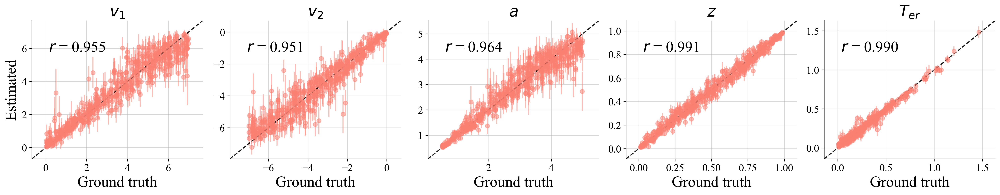

In [25]:
# Generate some validation data
validation_sims = configurator(model_001(batch_size=500))

# Extract unstandardized prior draws and transform to original scale
prior_samples = validation_sims["parameters"] 

print(
    f"Estimation will be performed on data sets with {validation_sims['summary_conditions'].shape[1]} simulated trials."
)

# Generate 100 posterior draws for each of the 1000 simulated data sets
post_samples = amortizer_001.sample(validation_sims, n_samples=150)
post_samples.shape

plt.rcParams['font.family'] = 'Times New Roman'
f = bf.diagnostics.plot_recovery(
    post_samples, prior_samples, param_names=prior.param_names, point_agg=np.mean, uncertainty_agg=np.std,color='salmon',add_r2=False,
    label_fontsize=22, title_fontsize=22, metric_fontsize=22, tick_fontsize=15
)
f.set_dpi(300)
plt.savefig(root_dir/"plots/parameter recovery DDM pi001.pdf", format="pdf", bbox_inches="tight")


## $\pi$=0.05

Estimation will be performed on data sets with 500 simulated trials.


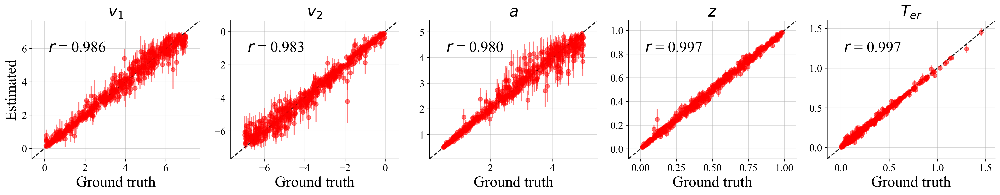

In [128]:
# Generate some validation data
validation_sims = configurator(model_005(batch_size=500))

# Extract unstandardized prior draws and transform to original scale
prior_samples = validation_sims["parameters"] 

print(
    f"Estimation will be performed on data sets with {validation_sims['summary_conditions'].shape[1]} simulated trials."
)

# Generate 100 posterior draws for each of the 1000 simulated data sets
post_samples = amortizer_005.sample(validation_sims, n_samples=150)
post_samples.shape

plt.rcParams['font.family'] = 'Times New Roman'
f = bf.diagnostics.plot_recovery(
    post_samples, prior_samples, param_names=prior.param_names, point_agg=np.mean, uncertainty_agg=np.std,color='red',add_r2=False,
    label_fontsize=22, title_fontsize=22, metric_fontsize=22, tick_fontsize=15
)
f.set_dpi(300)

plt.savefig(root_dir/"plots/parameter recovery DDM pi005.pdf", format="pdf", bbox_inches="tight")


## $\pi$=0.10

Estimation will be performed on data sets with 500 simulated trials.


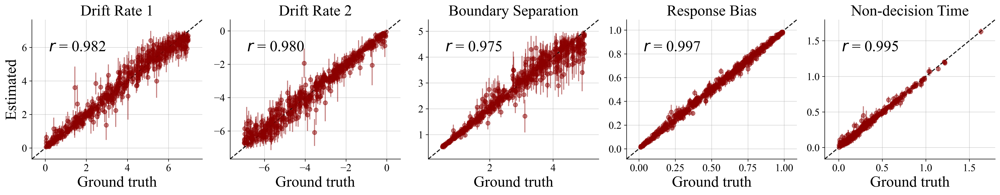

In [67]:
# Generate some validation data
validation_sims = configurator(model_010(batch_size=500))

# Extract unstandardized prior draws and transform to original scale
prior_samples = validation_sims["parameters"] 

print(
    f"Estimation will be performed on data sets with {validation_sims['summary_conditions'].shape[1]} simulated trials."
)

# Generate 100 posterior draws for each of the 1000 simulated data sets
post_samples = amortizer_010.sample(validation_sims, n_samples=150)
post_samples.shape

plt.rcParams['font.family'] = 'Times New Roman'
f = bf.diagnostics.plot_recovery(
    post_samples, prior_samples, param_names=prior.param_names, point_agg=np.mean, uncertainty_agg=np.std,color='darkred',add_r2=False,
    label_fontsize=22, title_fontsize=22, metric_fontsize=22, tick_fontsize=15
)
f.set_dpi(300)

plt.savefig(root_dir/"plots/parameter recovery DDM pi010.pdf", format="pdf", bbox_inches="tight")


## $\pi$=0.20

Estimation will be performed on data sets with 500 simulated trials.


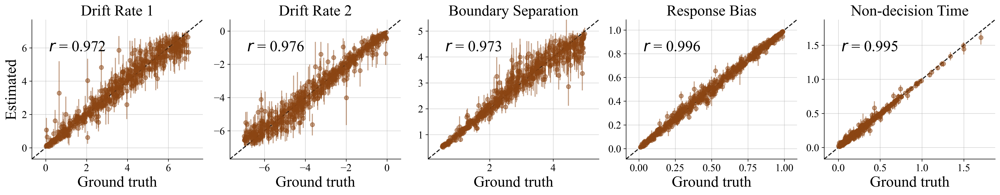

In [68]:
# Generate some validation data
validation_sims = configurator(model_020(batch_size=500))

# Extract unstandardized prior draws and transform to original scale
prior_samples = validation_sims["parameters"] 

print(
    f"Estimation will be performed on data sets with {validation_sims['summary_conditions'].shape[1]} simulated trials."
)

# Generate 100 posterior draws for each of the 1000 simulated data sets
post_samples = amortizer_020.sample(validation_sims, n_samples=150)
post_samples.shape

plt.rcParams['font.family'] = 'Times New Roman'
f = bf.diagnostics.plot_recovery(
    post_samples, prior_samples, param_names=prior.param_names, point_agg=np.mean, uncertainty_agg=np.std,color='saddlebrown',add_r2=False,
    label_fontsize=22, title_fontsize=22, metric_fontsize=22, tick_fontsize=15
)
f.set_dpi(300)

plt.savefig(root_dir/"plots/parameter recovery DDM pi020.pdf", format="pdf", bbox_inches="tight")


## EIF of robust estimators with different $\pi$

In [ ]:
#outliers range from 0.01 to 20
xinfl = np.arange(0.01, 20, 0.05)
infl_001 = compute_eif(xinfl, model=model_001, trainer=trainer_001)
infl_005 = compute_eif(xinfl, model=model_005, trainer=trainer_005)
infl_010 = compute_eif(xinfl, model=model_010, trainer=trainer_010)
infl_020 = compute_eif(xinfl, model=model_020, trainer=trainer_020)

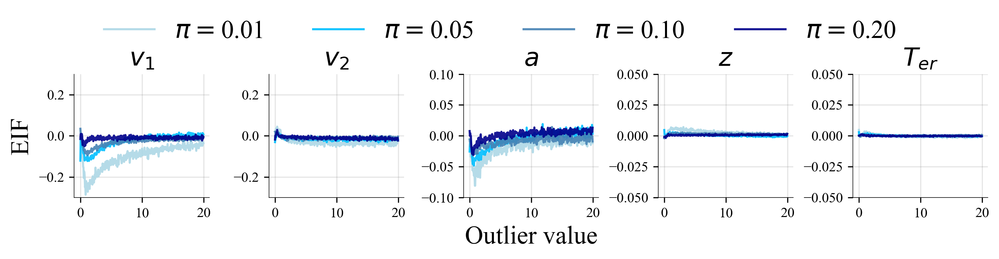

In [57]:
xinfl = np.arange(0.01, 20, 0.05)
fig, axes = plt.subplots(nrows=1, ncols=5, dpi=300, figsize=(10, 2.3))
plt.subplots_adjust(hspace=0.4, wspace=0.4)
plt.rcParams['font.family'] = 'Times New Roman'
ylim = [[-0.3,0.3],[-0.3,0.3],[-0.1,0.1],[-0.05,0.05],[-0.05,0.05]]

# Plot data and diagonal lines
for i in range(5):
    axes[i].plot(xinfl, infl_001[:,i], color='lightblue',alpha=0.9)
    axes[i].plot(xinfl, infl_005[:,i], color='deepskyblue',alpha=0.9)
    axes[i].plot(xinfl, infl_010[:,i], color='steelblue',alpha=0.9)
    axes[i].plot(xinfl, infl_020[:,i], color='darkblue',alpha=0.9)
    axes[i].set_title(PARAM_NAMES[i], size=18)
    axes[2].set_xlabel('Outlier value', size=18)
    axes[0].set_ylabel('EIF', size=18)
    axes[i].set_ylim(ylim[i])
    

    # Remove top and right spines
    axes[i].spines['top'].set_visible(False)
    axes[i].spines['right'].set_visible(False)

    # Set grey grid
    axes[i].grid(color='grey', linestyle='-',alpha=0.2)

    # Show only bottom and left ticks
    axes[i].xaxis.set_ticks_position('bottom')
    axes[i].yaxis.set_ticks_position('left')
    
    axes[i].tick_params(axis='x', labelsize=10)
    axes[i].tick_params(axis='y', labelsize=10)
    
    for spine in axes[i].spines.values():
        spine.set_linewidth(0.4)  # Adjust the line width here

fig.legend([r'$\pi=$''0.01', r'$\pi=$''0.05', r'$\pi=$''0.10',r'$\pi=$''0.20'], loc='upper center',ncol=4, fontsize=18, bbox_to_anchor=(0.5, 1.15), frameon=False)

plt.tight_layout()
plt.savefig(root_dir/"plots/EIF DDM pi.pdf", format="pdf", bbox_inches="tight")

plt.show()


In [ ]:
#outliers range from 0.01 to 1
xinfl = np.arange(0.01, 1, 0.01)
infl_001_01 = compute_eif(xinfl, model=model_001, trainer=trainer_001)
infl_005_01 = compute_eif(xinfl, model=model_005, trainer=trainer_005)
infl_010_01 = compute_eif(xinfl, model=model_010, trainer=trainer_010)
infl_020_01 = compute_eif(xinfl, model=model_020, trainer=trainer_020)


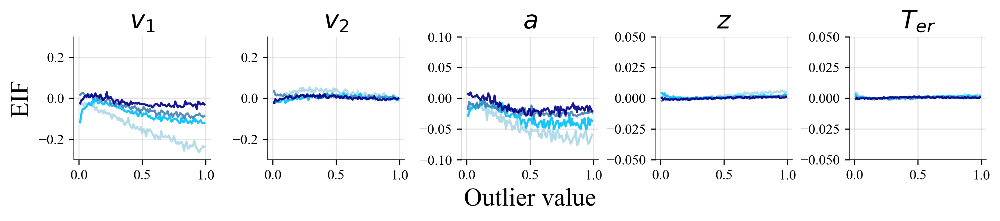

In [58]:
xinfl = np.arange(0.01, 1, 0.01)
fig, axes = plt.subplots(nrows=1, ncols=5, dpi=300, figsize=(10, 2.3))
plt.subplots_adjust(hspace=0.4, wspace=0.4)
plt.rcParams['font.family'] = 'Times New Roman'
ylim = [[-0.3,0.3],[-0.3,0.3],[-0.1,0.1],[-0.05,0.05],[-0.05,0.05]]

# Plot data and diagonal lines
for i in range(5):
    axes[i].plot(xinfl, infl_001_01[:,i], color='lightblue',alpha=0.9)
    axes[i].plot(xinfl, infl_005_01[:,i], color='deepskyblue',alpha=0.9)
    axes[i].plot(xinfl, infl_010_01[:,i], color='steelblue',alpha=0.9)
    axes[i].plot(xinfl, infl_020_01[:,i], color='darkblue',alpha=0.9)
    axes[i].set_title(PARAM_NAMES[i], size=18)
    axes[2].set_xlabel('Outlier value', size=18)
    axes[0].set_ylabel('EIF', size=18)
    axes[i].set_ylim(ylim[i])
    

    # Remove top and right spines
    axes[i].spines['top'].set_visible(False)
    axes[i].spines['right'].set_visible(False)

    # Set grey grid
    axes[i].grid(color='grey', linestyle='-',alpha=0.2)

    # Show only bottom and left ticks
    axes[i].xaxis.set_ticks_position('bottom')
    axes[i].yaxis.set_ticks_position('left')
    
    axes[i].tick_params(axis='x', labelsize=10)
    axes[i].tick_params(axis='y', labelsize=10)
    
    for spine in axes[i].spines.values():
        spine.set_linewidth(0.4)  # Adjust the line width here


plt.tight_layout()

plt.savefig(root_dir/"plots/EIF DDM pi 0-1s.pdf", format="pdf", bbox_inches="tight")
plt.show()


## BP of robust estimator with different $\pi$

In [ ]:
ninfl = np.arange(1, 101, 1)
bp_001 = compute_bp(ninfl = ninfl, model = model_001, amortizer = amortizer_001, trainer = trainer_001, x_c=0.01)
bp_005 = compute_bp(ninfl = ninfl, model = model_005, amortizer = amortizer_005, trainer = trainer_005, x_c=0.01)
bp_010 = compute_bp(ninfl = ninfl, model = model_010, amortizer = amortizer_010, trainer = trainer_010, x_c=0.01)
bp_020 = compute_bp(ninfl = ninfl, model = model_020, amortizer = amortizer_020, trainer = trainer_020, x_c=0.01)

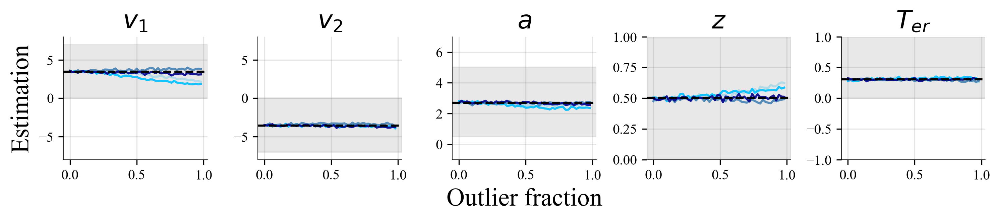

In [59]:
sim_data = model(batch_size=1000)
post_samples_orig = amortizer.sample(trainer.configurator(sim_data), n_samples=150)
no_infl = np.mean(np.mean(post_samples_orig, axis=1), axis=0) 
ninfl = np.arange(1, 51, 1)
# Create the figure and axes
fig, axes = plt.subplots(nrows=1, ncols=5, dpi=300, figsize=(10, 2.3))
plt.subplots_adjust(hspace=0.4, wspace=0.4)
plt.rcParams['font.family'] = 'Times New Roman'
ylim = [(-8,8),(-8,8),(-1,7),(0,1),(-1,1)]
hspan = [(0,7),(-7,0),(0.5,5),(0.01,0.99),(0,2)]
# Plot data and diagonal lines
for i in range(5):
    axes[i].plot(np.arange(0, 1.00, 0.02), bp_001[0:50,i], color='lightblue',alpha=0.9)
    axes[i].plot(np.arange(0, 1.00, 0.02), bp_005[0:50,i], color='deepskyblue',alpha=0.9)
    axes[i].plot(np.arange(0, 1.00, 0.02), bp_010[0:50,i], color='steelblue',alpha=0.9)
    axes[i].plot(np.arange(0, 1.00, 0.02), bp_020[0:50,i], color='darkblue',alpha=0.9)
    axes[i].set_title(PARAM_NAMES[i], size=18)
    axes[2].set_xlabel('Outlier fraction', size=18)
    axes[0].set_ylabel('Estimation', size=18)
    axes[i].set_ylim(ylim[i])
    axes[i].axhline(y=no_infl[i], color='black', linestyle='--', label='Horizontal Line at x=a')

    # Remove top and right spines
    axes[i].spines['top'].set_visible(False)
    axes[i].spines['right'].set_visible(False)

    # Set grey grid
    axes[i].grid(color='grey', linestyle='-',alpha=0.2)

    # Show only bottom and left ticks
    axes[i].xaxis.set_ticks_position('bottom')
    axes[i].yaxis.set_ticks_position('left')
    
    axes[i].tick_params(axis='x', labelsize=10)
    axes[i].tick_params(axis='y', labelsize=10)
    
    for spine in axes[i].spines.values():
        spine.set_linewidth(0.4)  # Adjust the line width here
    
    axes[i].axhspan(hspan[i][0],hspan[i][1], color='lightgrey', alpha=0.5)

plt.tight_layout()
plt.savefig(root_dir/"plots/BP DDM 0.01s robust pi.pdf", format="pdf", bbox_inches="tight")

plt.show()


In [ ]:
ninfl = np.arange(1, 101, 1)
bp_001_20 = compute_bp(ninfl = ninfl, model = model_001, amortizer = amortizer_001, trainer = trainer_001, x_c=20)
bp_005_20 = compute_bp(ninfl = ninfl, model = model_005, amortizer = amortizer_005, trainer = trainer_005, x_c=20)
bp_010_20 = compute_bp(ninfl = ninfl, model = model_010, amortizer = amortizer_010, trainer = trainer_010, x_c=20)
bp_020_20 = compute_bp(ninfl = ninfl, model = model_020, amortizer = amortizer_020, trainer = trainer_020, x_c=20)


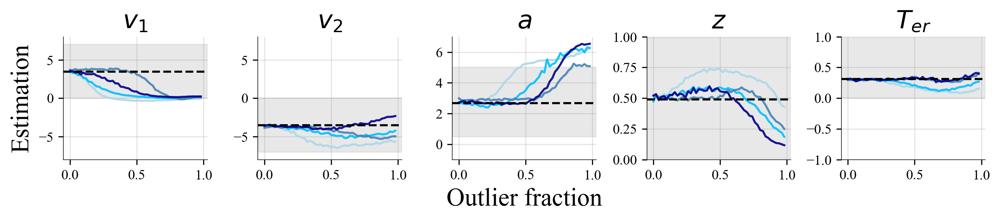

In [60]:
sim_data = model(batch_size=1000)
post_samples_orig = amortizer.sample(trainer.configurator(sim_data), n_samples=150)
no_infl = np.mean(np.mean(post_samples_orig, axis=1), axis=0) 
ninfl = np.arange(1, 51, 1)
# Create the figure and axes
fig, axes = plt.subplots(nrows=1, ncols=5, dpi=300, figsize=(10, 2.3))
plt.subplots_adjust(hspace=0.4, wspace=0.4)
plt.rcParams['font.family'] = 'Times New Roman'
ylim = [(-8,8),(-8,8),(-1,7),(0,1),(-1,1)]
hspan = [(0,7),(-7,0),(0.5,5),(0.01,0.99),(0,2)]
# Plot data and diagonal lines
for i in range(5):
    axes[i].plot(np.arange(0, 1.00, 0.02), bp_001_20[0:50,i], color='lightblue',alpha=0.9)
    axes[i].plot(np.arange(0, 1.00, 0.02), bp_005_20[0:50,i], color='deepskyblue',alpha=0.9)
    axes[i].plot(np.arange(0, 1.00, 0.02), bp_010_20[0:50,i], color='steelblue',alpha=0.9)
    axes[i].plot(np.arange(0, 1.00, 0.02), bp_020_20[0:50,i], color='darkblue',alpha=0.9)
    axes[i].set_title(PARAM_NAMES[i], size=18)
    axes[2].set_xlabel('Outlier fraction', size=18)
    axes[0].set_ylabel('Estimation', size=18)
    axes[i].set_ylim(ylim[i])
    axes[i].axhline(y=no_infl[i], color='black', linestyle='--', label='Horizontal Line at x=a')

    # Remove top and right spines
    axes[i].spines['top'].set_visible(False)
    axes[i].spines['right'].set_visible(False)

    # Set grey grid
    axes[i].grid(color='grey', linestyle='-',alpha=0.2)

    # Show only bottom and left ticks
    axes[i].xaxis.set_ticks_position('bottom')
    axes[i].yaxis.set_ticks_position('left')
    
    axes[i].tick_params(axis='x', labelsize=10)
    axes[i].tick_params(axis='y', labelsize=10)
    
    for spine in axes[i].spines.values():
        spine.set_linewidth(0.4)  # Adjust the line width here
    
    axes[i].axhspan(hspan[i][0],hspan[i][1], color='lightgrey', alpha=0.5)

plt.tight_layout()
plt.savefig(root_dir/"plots/BP DDM 20s robust pi.pdf", format="pdf", bbox_inches="tight")

plt.show()


## Mean absolute error and variance

In [77]:
test_sims = model(batch_size=10000)
def cost(amortizer, n_samples=200):
    post_samples = amortizer.sample(trainer.configurator(test_sims), n_samples=n_samples)
    post_samples_mean = np.mean(post_samples,axis=1)
    true_parameters =  test_sims['prior_draws']
    MAE = np.nanmean(np.abs(true_parameters-post_samples_mean),axis=0)
    VAR = np.nanmean(np.var(post_samples,axis=1),axis=0)
    
    return MAE, VAR

In [ ]:
#when estimating clean data
MAE_ddm_standard_pi, VAR_ddm_standard_pi = cost(amortizer=amortizer)
MAE_ddm_001, VAR_ddm_001 = cost(amortizer=amortizer_001)
MAE_ddm_005, VAR_ddm_005 = cost(amortizer=amortizer_005)
MAE_ddm_010, VAR_ddm_010 = cost(amortizer=amortizer_010)
MAE_ddm_020, VAR_ddm_020 = cost(amortizer=amortizer_020)

In [80]:
print(f'ErrorRatio pi=0.01', np.round(MAE_ddm_standard_pi/MAE_ddm_df1,3))
print(f'ErrorRatio pi=0.05', np.round(MAE_ddm_standard_pi/MAE_ddm_df3,3))
print(f'ErrorRatio pi=0.10', np.round(MAE_ddm_standard_pi/MAE_ddm_df5,3))
print(f'ErrorRatio pi=0.20', np.round(MAE_ddm_standard_pi/MAE_uniform,3))

print(f'VarRatio pi=0.01', np.round(VAR_ddm_standard_pi/VAR_ddm_001,3))
print(f'VarRatio pi=0.05', np.round(VAR_ddm_standard_pi/VAR_ddm_005,3))
print(f'VarRatio pi=0.10', np.round(VAR_ddm_standard_pi/VAR_ddm_010,3))
print(f'VarRatio pi=0.20', np.round(VAR_ddm_standard_pi/VAR_ddm_020,3))

ErrorRatio pi=0.01 [0.759 0.802 0.777 0.907 0.826]
ErrorRatio pi=0.05 [0.73  0.732 0.735 0.892 0.797]
ErrorRatio pi=0.10 [0.728 0.751 0.741 0.889 0.764]
ErrorRatio pi=0.20 [0.875 0.907 0.916 0.965 0.884]
VarRatio pi=0.01 [0.823 0.807 0.885 0.978 0.864]
VarRatio pi=0.05 [0.72  0.699 0.74  0.819 0.71 ]
VarRatio pi=0.10 [0.617 0.596 0.615 0.734 0.574]
VarRatio pi=0.20 [0.436 0.517 0.531 0.574 0.492]
